In [1]:
# Load Packages
library(Pando)
library(Seurat)
library(Signac)
library(BSgenome.Hsapiens.UCSC.hg38)
library(SeuratObject)
library(tidyverse) # need this for pivot_wider()

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:Pando’:

    LayerData, VariableFeatures


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘Seurat’


The following objects are masked from ‘package:Pando’:

    GetAssay, VariableFeatures


Loading required package: GenomeInfoDb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Po

## Running Pando
08c_pando_ngc.R

# Full sample run

In [2]:
# load output from R script
sobj <- readRDS("08c_pando_objects/08c_ngc_pando_sobj_2.rds")
modules <- readRDS("08c_pando_objects/08c_ngc_pando_modules_2.rds")

In [3]:
GetNetwork(sobj)

A Network object
with 238 TFs and 443 target genes

In [6]:
coef(sobj@grn)

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HMGA2,IL3RA,chrX-1239459-1240394,HMGA2:chrX_1239459_1240394,-0.003034754,0.03107030,-0.09767378,9.221938e-01,9.967800e-01,0.1524199
HMGA2,IL3RA,chrX-1249271-1250179,HMGA2:chrX_1249271_1250179,0.260591060,0.01340771,19.43590676,2.976427e-82,1.036489e-79,0.1524199
RLF,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:RLF,-0.005745815,0.05598099,-0.10263868,9.182526e-01,9.964553e-01,0.1576562
HIVEP3,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:HIVEP3,0.089890298,0.07973663,1.12734010,2.596361e-01,8.288942e-01,0.2333268
MECOM,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:MECOM,0.021645399,0.12719142,0.17017971,8.648736e-01,9.934819e-01,0.1320205
MXD4,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:MXD4,0.479336594,0.23404363,2.04806511,4.058960e-02,4.632811e-01,-0.1231881
HMGA1,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:HMGA1,-0.032297980,0.07263589,-0.44465592,6.565817e-01,9.640283e-01,0.1486925
TRERF1,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:TRERF1,-0.074044494,0.12837718,-0.57677301,5.641107e-01,9.494066e-01,0.1058250
ZNF292,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:ZNF292,0.167928499,0.07167822,2.34281077,1.916601e-02,3.270156e-01,0.1816026


In [4]:
# params of models
# dataframe of coeff's and p-vals for each tf/region-target pair
coef(sobj)
# write.csv(coefs, "08c_pando_objects/08c_ngc_pando_coefs.csv")

tf,target,region,term,estimate,std_err,statistic,pval,padj,corr
<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
HMGA2,IL3RA,chrX-1239459-1240394,HMGA2:chrX_1239459_1240394,-0.003034754,0.03107030,-0.09767378,9.221938e-01,9.967800e-01,0.1524199
HMGA2,IL3RA,chrX-1249271-1250179,HMGA2:chrX_1249271_1250179,0.260591060,0.01340771,19.43590676,2.976427e-82,1.036489e-79,0.1524199
RLF,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:RLF,-0.005745815,0.05598099,-0.10263868,9.182526e-01,9.964553e-01,0.1576562
HIVEP3,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:HIVEP3,0.089890298,0.07973663,1.12734010,2.596361e-01,8.288942e-01,0.2333268
MECOM,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:MECOM,0.021645399,0.12719142,0.17017971,8.648736e-01,9.934819e-01,0.1320205
MXD4,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:MXD4,0.479336594,0.23404363,2.04806511,4.058960e-02,4.632811e-01,-0.1231881
HMGA1,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:HMGA1,-0.032297980,0.07263589,-0.44465592,6.565817e-01,9.640283e-01,0.1486925
TRERF1,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:TRERF1,-0.074044494,0.12837718,-0.57677301,5.641107e-01,9.494066e-01,0.1058250
ZNF292,TBL1X,chrX-9369535-9370460,chrX_9369535_9370460:ZNF292,0.167928499,0.07167822,2.34281077,1.916601e-02,3.270156e-01,0.1816026


ERROR: Error in eval(expr, p): object 'coefs' not found


## Module Discovery
find_modules() ran with defaults in R script

In [7]:
head(modules@meta)

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
ALX4,ITGBL1,0.20184433,2,1,4,chr13-101529242-101530130,4.878102e-28,1.433383e-25
ARID3A,COLGALT2,-0.05250742,9,1,10,chr1-184051337-184051676,4.364139e-04,2.551362e-02
ARID5A,IFI16,0.13965160,3,2,4,chr1-159006042-159006431,9.390948e-40,2.919960e-37
ARID5A,MIR222HG,0.09082622,3,2,5,chrX-45811043-45812040,1.267638e-14,3.102221e-12
ARID5B,BLVRB,-0.17434720,11,5,11,chr19-40444706-40445050,3.139044e-06,3.683082e-04
ARID5B,LRRC8C,0.07502638,6,5,21,chr1-89701511-89702467,8.708388e-04,4.366396e-02


Warning message:
“Using alpha for a discrete variable is not advised.”


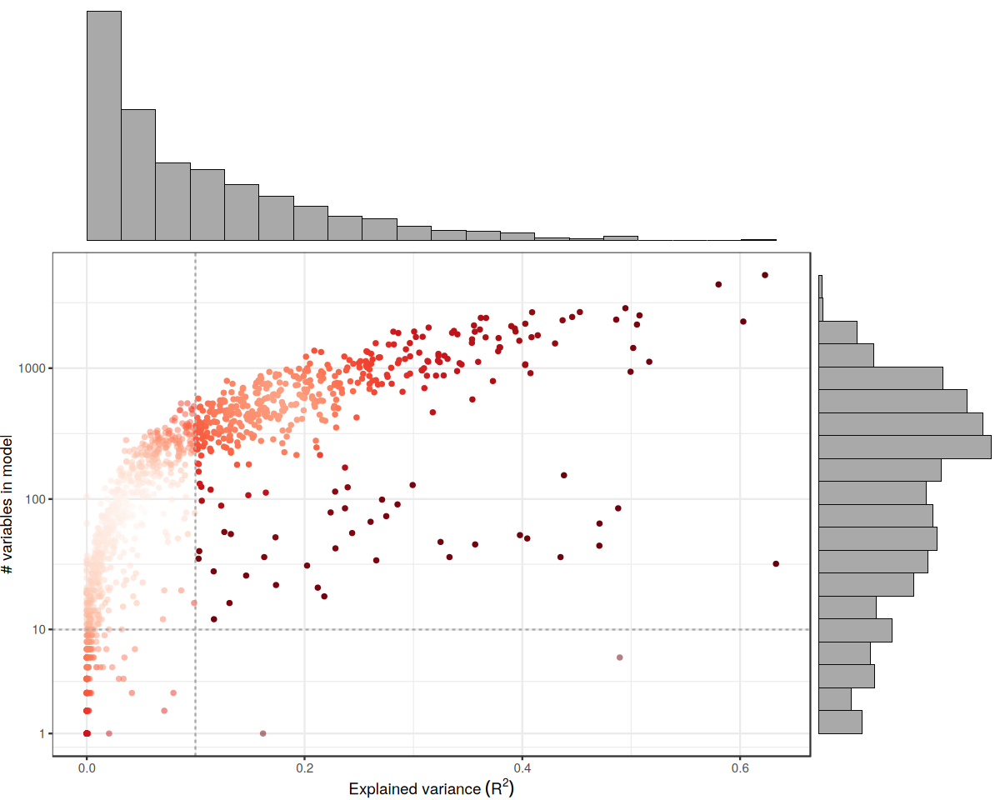

In [8]:
# goodness of fit metrics 
options(repr.plot.width=10, repr.plot.height=8)
plot_gof(sobj, point_size = 1.5)

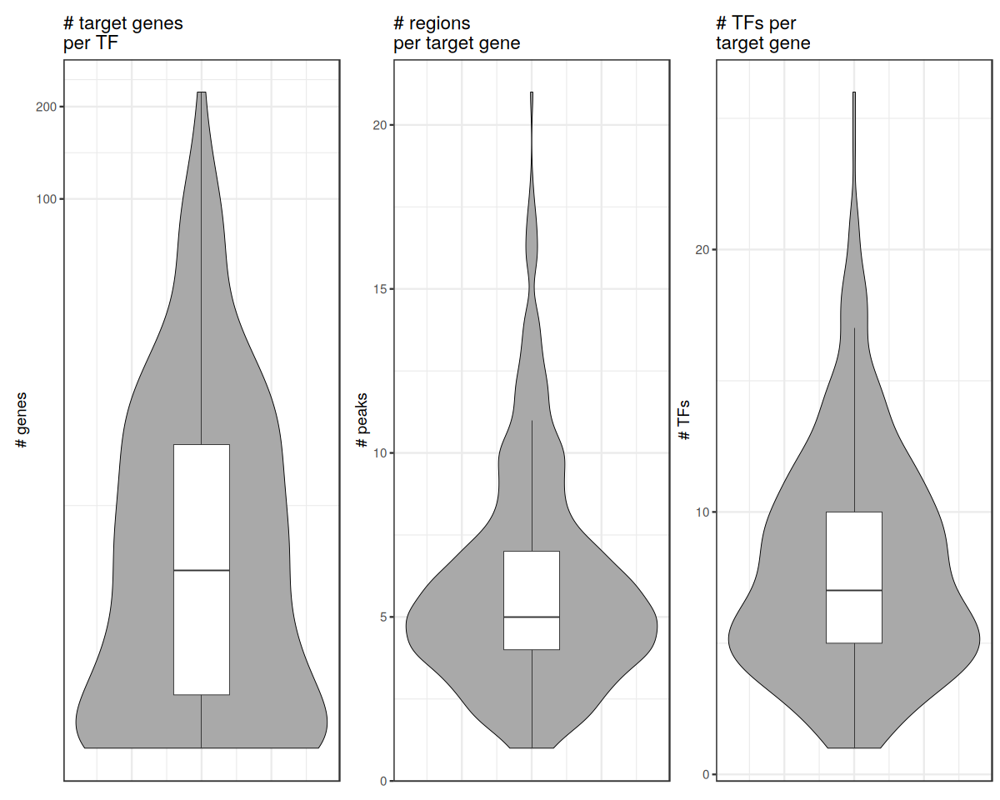

In [9]:
plot_module_metrics(sobj)

## Visualizing the GRN

In [10]:
sobj <- get_network_graph(sobj)

Computing gene-gene correlation

Computing weighted regulatory factor

Computing UMAP embedding

Getting network graph



### Kaivalya genes

In [ ]:
sobj <- get_network_graph(
    sobj, 
    graph_name = 'full_graph', 
    umap_method = 'none'
)

Getting network graph



Getting shortest paths from TF



Error with TF: HIC2 
Error message: Invalid vertex names 


Getting shortest paths from TF



Error with TF: SMAD3 
Error message: Invalid vertex names 


Getting shortest paths from TF



Error with TF: LEF1 
Error message: Invalid vertex names 


Getting shortest paths from TF



Error with TF: MITF 
Error message: Selected TF has fewer than 3 targets. 


Getting shortest paths from TF



Pruning graph

Getting shortest paths from TF

Pruning graph

Getting shortest paths from TF

Pruning graph



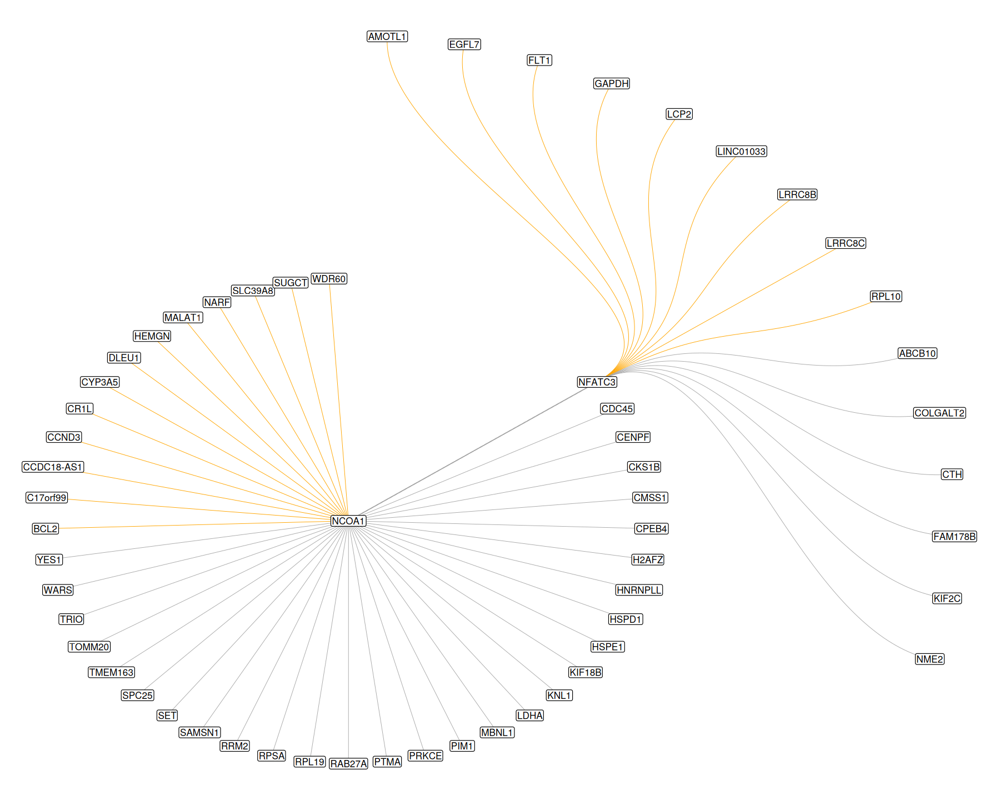

Getting shortest paths from TF

Pruning graph



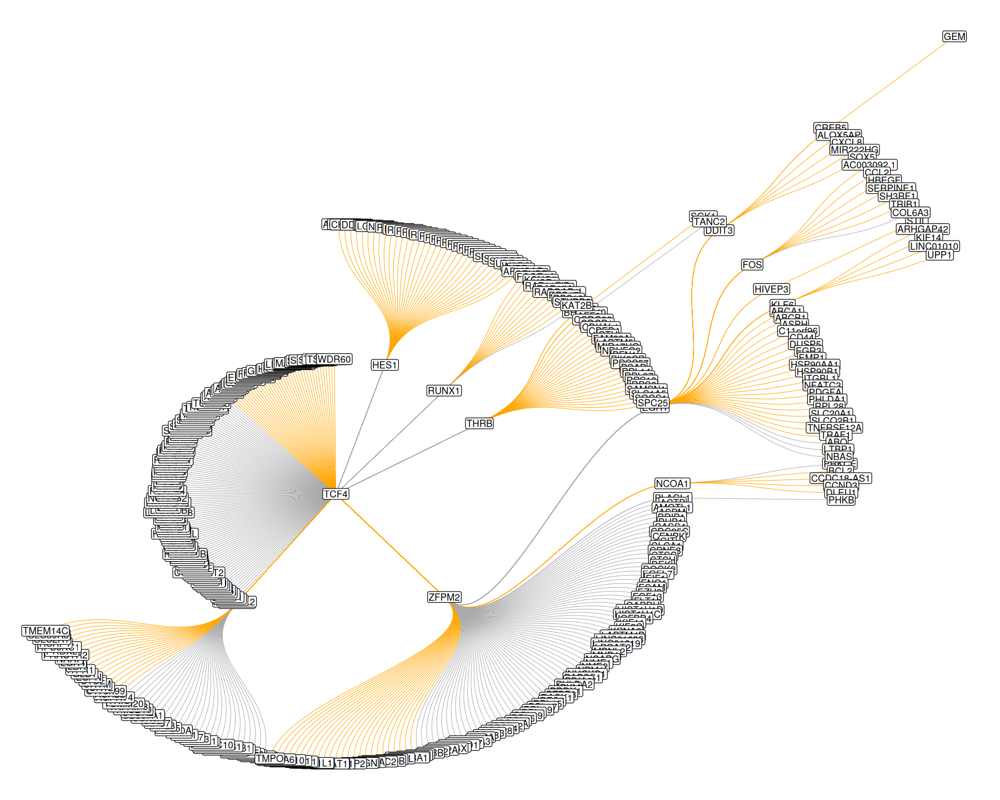

Getting shortest paths from TF



Error with TF: ZNF124 
Error message: Invalid vertex names 


Getting shortest paths from TF

Pruning graph



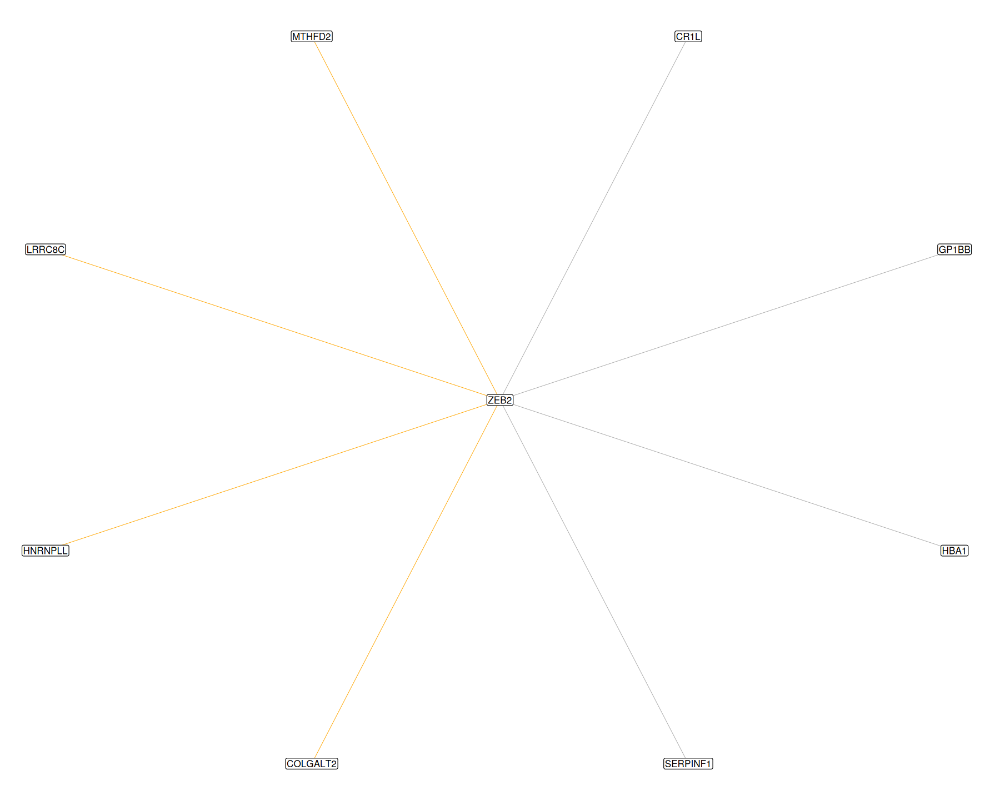

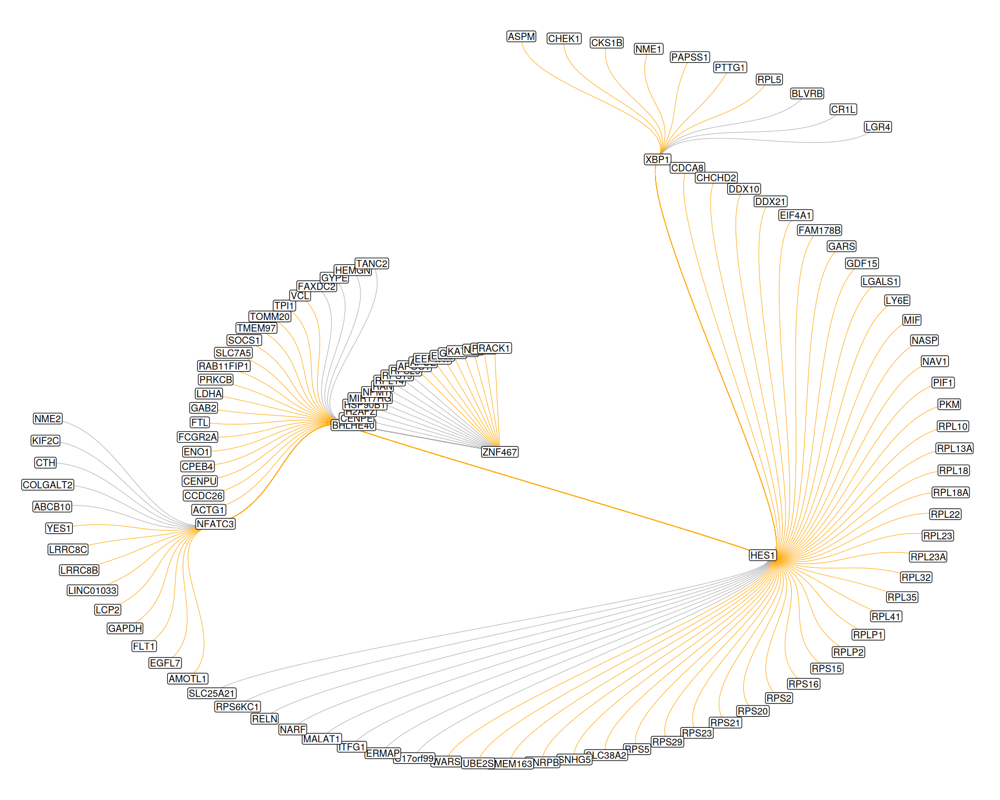

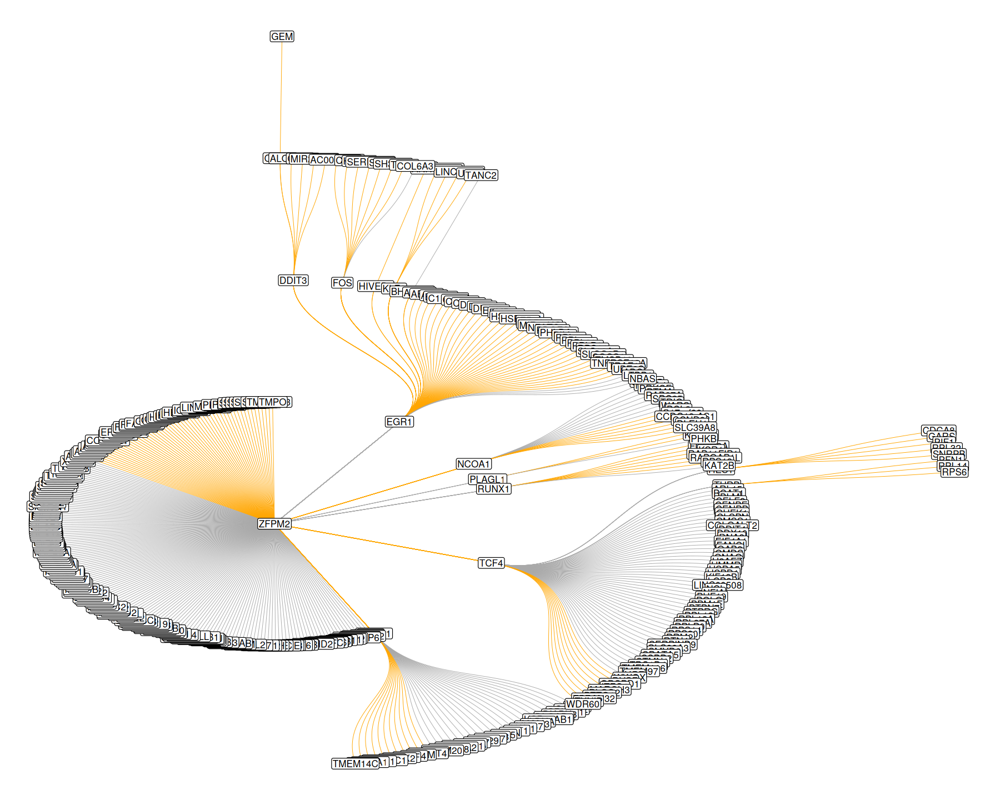

In [ ]:
# List of transcription factors
ks_genes <- c("HIC2", "SMAD3", "LEF1", "MITF", "NCOA1", "TCF4", "ZEB2", "ZNF467", "ZNF124", "ZFPM2")

# Loop through each transcription factor
for (tf in ks_genes) {
  tryCatch({
    # Run the get_tf_network function
    sobj <- get_tf_network(sobj, tf = tf, graph = 'full_graph')
    
    # Plot the TF network
    print(plot_tf_network(sobj, tf = tf, label_nodes = "all"))
  }, error = function(e) {
    # Print the TF that failed and the error message
    cat("Error with TF:", tf, "\nError message:", e$message, "\n")
  })
}


### Graph visualization
Here, the nodes are colored and sized based on their centrality in the graph and the edges are colored by the direction of the regulation (inhibitory: grey; activating: orange)

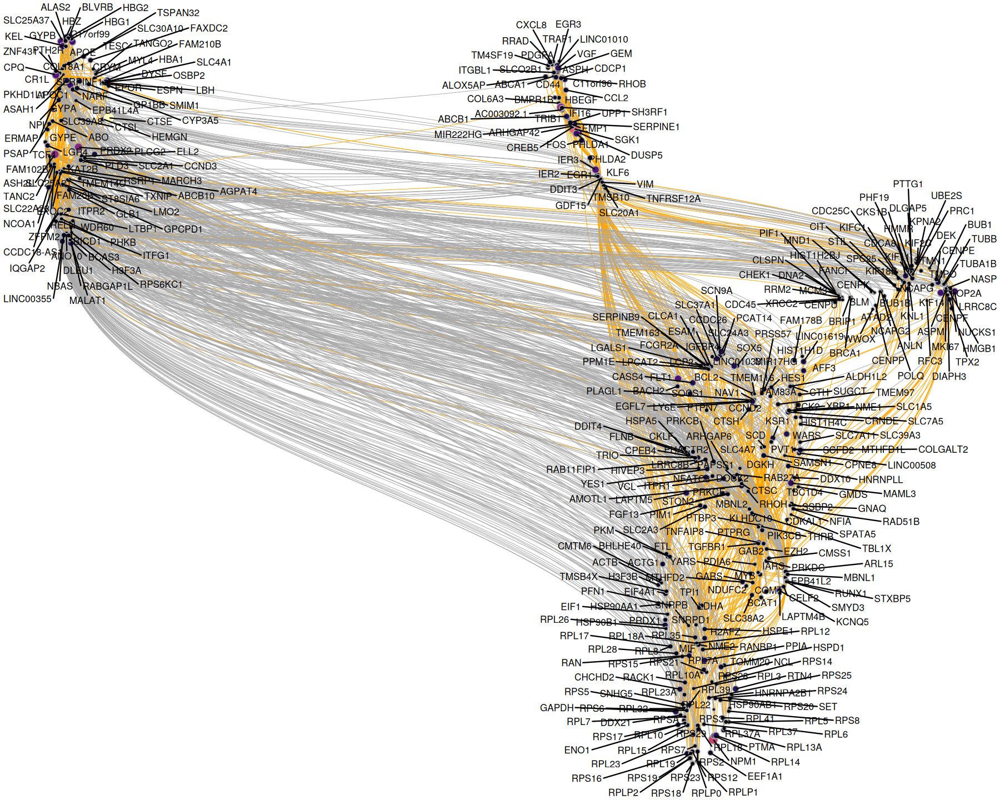

In [ ]:
# visualize GRN
options(repr.plot.width=15, repr.plot.height=12)
plot_network_graph(sobj)

In [ ]:
sobj <- get_network_graph(
    sobj, 
    graph_name = 'sub_graph', 
    umap_method = 'none',
    features = c("HIC2","PHT2R", "APOE", "CPQ", "COL18A1", "APOC1", "GP1BB", "PRKN", "CTSL", "TCF4", "AC008825.1", "SLC30A10", "NCOA1", "NPL", "LGR4", "NARF", "RELN", "TANC2", "ASH2L", "ZFPM2", "IQGAP2")
)


Getting network graph



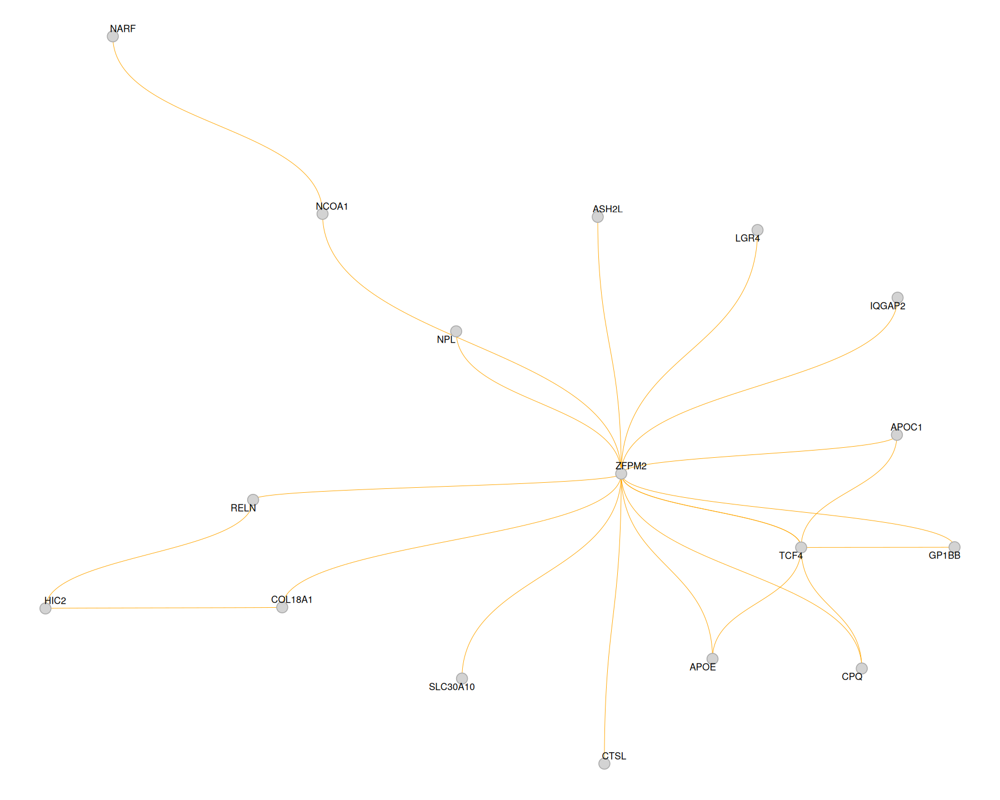

In [ ]:
plot_network_graph(sobj, graph='sub_graph', layout='fr', color_nodes=F, node_size=5)

In [ ]:
sobj <- get_network_graph(sobj, graph_name='umap_graph')
sobj <- get_network_graph(
    sobj, 
    graph_name = 'full_graph', 
    umap_method = 'none'
)

Computing gene-gene correlation

Computing weighted regulatory factor

Computing UMAP embedding

Getting network graph

Getting network graph



Warning message in layout_with_eigen(graph, type = type, ev = eigenvector):
“g is directed. undirected version is used for the layout.”


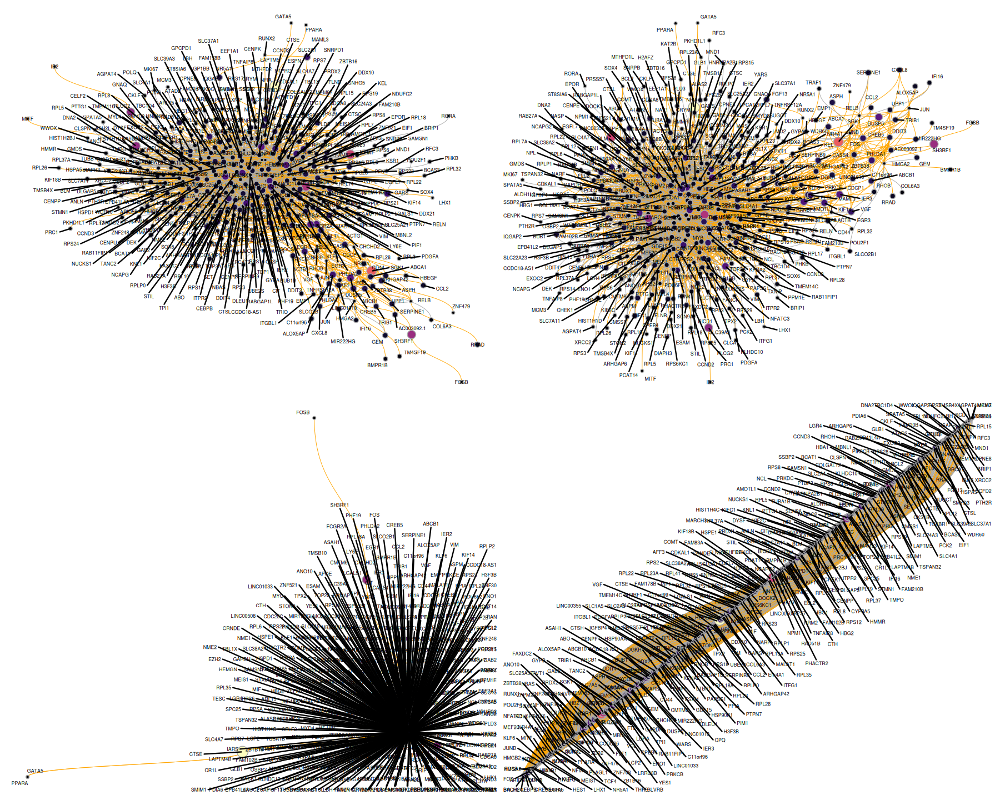

In [ ]:
p1 <- plot_network_graph(sobj, graph='full_graph', layout='fr', text_size=5)
p2 <- plot_network_graph(sobj, graph='full_graph', layout='drl', text_size=5)
p3 <- plot_network_graph(sobj, graph='full_graph', layout='eigen', text_size=5)
p4 <- plot_network_graph(sobj, graph='full_graph', layout='matrix', text_size=5)
(p1 | p2) / (p3 | p4)

## Plot DE Genes from DASA HIC2 vs DASA NT

In [12]:
feature_list <- read.csv('{PATH_1}')

In [13]:
feature_list[feature_list$avg_log2FC>0,1]

[1] "HBA1"         "MGST3"        "PRDX2"        "AMMECR1"      "CTSE"        
  [6] "HBG2"         "TMEM14B"      "HBG1"         "TMEM14C"      "STAR"        
 [11] "ESPN"         "AC016629.2"   "SLC4A1"       "ABCB9"        "ATF7IP2"     
 [16] "HBA2"         "AHSP"         "WIPF3"        "CR1L"         "AL442636.1"  
 [21] "MGST2"        "NDFIP1"       "SPECC1"       "CLTCL1"       "ATP5IF1"     
 [26] "PKLR"         "HMBS"         "MAN1A1"       "AC007563.2"   "SLC39A8"     
 [31] "AC079804.3"   "ZNF83"        "UGCG"         "LINC01748"    "SCPEP1"      
 [36] "ANK1"         "GRK4"         "AK1"          "MARCKSL1"     "CD58"        
 [41] "FADS1"        "TNNI3"        "PSTPIP2"      "MIS18BP1"     "CALM3"       
 [46] "DGAT1"        "CABIN1"       "KSR1"         "HBM"          "OAT"         
 [51] "NMNAT3"       "SLC6A19"      "BLVRB"        "HBZ"          "UBXN4"       
 [56] "SGMS1"        "PAM16"        "LRP10"        "GSTO1"        "OPTN"        
 [61] "NPW"          "VPS13D"       "FAM210B"      "EGFL8"        "PPT2"        
 [66] "CTSB"         "TMEM191C"     "LIPH"         "REEP6"        "ITLN1"       
 [71] "FGF13"        "NAPEPLD"      "MARCH3"       "APLP2"        "HIST1H1C"    
 [76] "RTL9"         "PLCD1"        "HDAC1"        "OSBPL8"       "PPIF"        
 [81] "PPARA"        "RAB3IP"       "TNFRSF14-AS1" "CYB561A3"     "NLK"         
 [86] "PARP14"       "AL713998.1"   "UQCR10"       "DENND4A"      "MAK"         
 [91] "FAM83A"       "SLC25A29"     "BUD23"        "NUSAP1"       "STAM"        
 [96] "ETFA"         "PTPRF"        "SLC41A1"      "TOP1"         "SLC30A1"     
[101] "UCP2"         "TFR2"         "GRAP2"        "AL137001.2"   "DYNLL1"      
[106] "CYP20A1"      "INSIG1"       "ZNF431"       "PRELID2"      "ZBTB16"      
[111] "SLC18B1"      "TFRC"         "PSME1"        "OSBPL9"       "SLC44A5"     
[116] "COMT"         "GATA1"        "RTN4"         "TFDP1"        "LINC01578"   
[121] "HSP90AA1"     "NFIA"         "AL713998.3"   "UBC"          "CEBPB"       
[126] "EIF1B"        "CFD"          "SH3GL3"       "UBA6"         "SLC25A37"    
[131] "GAB3"         "HLTF"         "RPL8"         "CLSTN3"       "PRG2"        
[136] "C11orf21"     "AL031123.5"   "COX7C"

In [ ]:
sobj <- get_network_graph(
    sobj, 
    graph_name = 'sub_graph', 
    umap_method = 'none',
    features = feature_list[feature_list$avg_log2FC>0,1])

Getting network graph



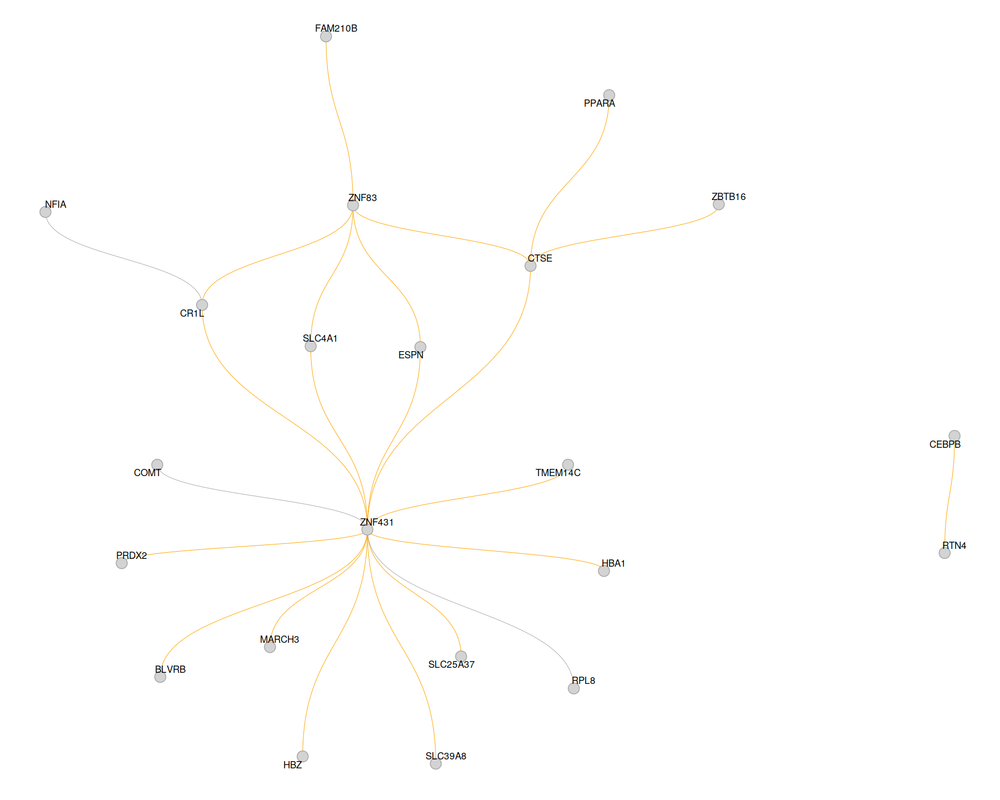

In [ ]:
plot_network_graph(sobj, graph='sub_graph', layout='fr', color_nodes=F, node_size = 5)

In [ ]:
# upreg'd in dying cells

Getting network graph



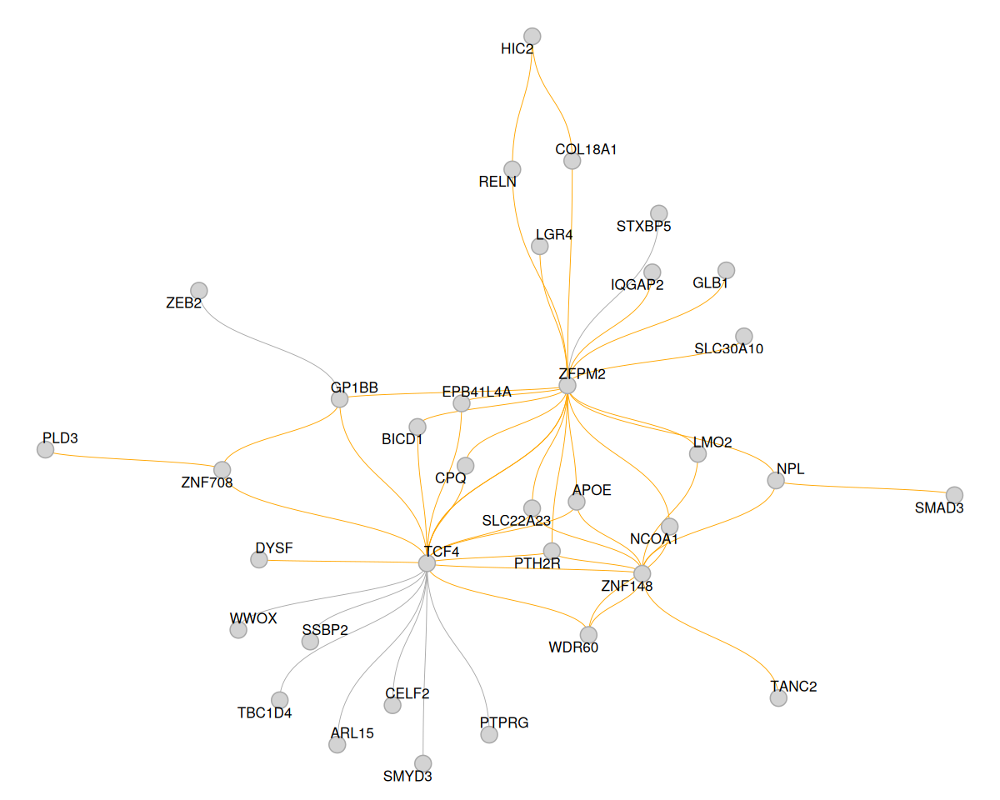

In [14]:
# down reg genes
sobj <- get_network_graph(
    sobj, 
    graph_name = 'sub_graph', 
    umap_method = 'none',
    features = feature_list[feature_list$avg_log2FC<0,1])

plot_network_graph(sobj, graph='sub_graph', layout='fr', color_nodes=F, node_size = 5)

In [ ]:
# upreg'd in dasa treatment for surviving dasa treatment == causees cells to survive in prescence of dasa
# plotting these genes on umap we'll see increased expression in dasa nt cluster

Computing gene-gene correlation

Computing weighted regulatory factor

Computing UMAP embedding

Getting network graph

Getting shortest paths from TF

Pruning graph



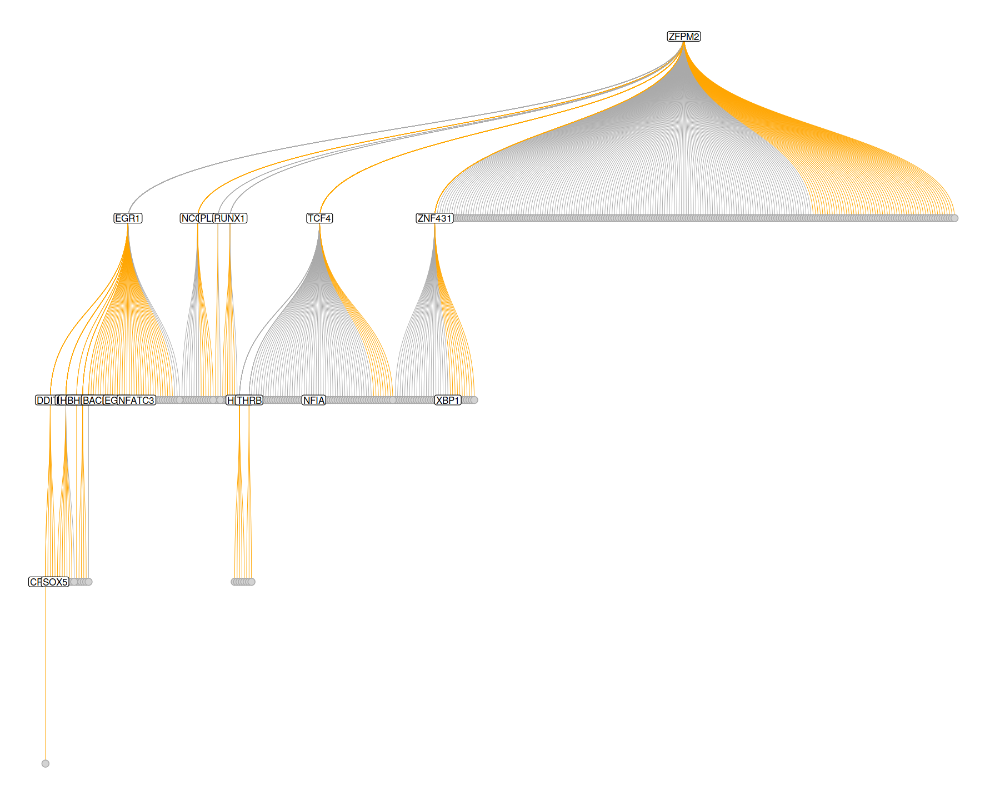

In [22]:
sobj <- get_network_graph(sobj)
sobj <- get_tf_network(sobj, tf = 'ZFPM2', graph='full_graph')
plot_tf_network(sobj, tf ='ZFPM2', circular=F)

Computing gene-gene correlation

Computing weighted regulatory factor

Computing UMAP embedding

Getting network graph

Getting shortest paths from TF

Pruning graph



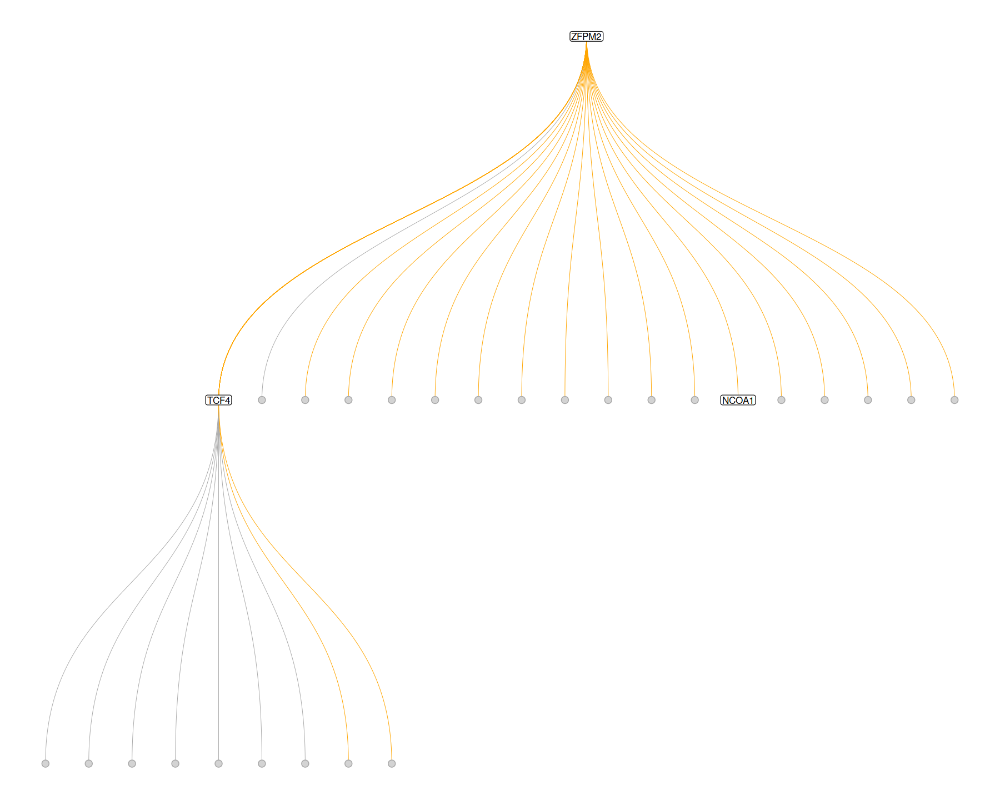

In [23]:
sobj <- get_network_graph(sobj)
sobj <- get_tf_network(sobj, tf = 'ZFPM2', graph='sub_graph')
plot_tf_network(sobj, tf ='ZFPM2', circular=F)

In the two graphs above, the edges have been pruned to retain only the stronges connection to each terminal node. One can also turn off this behavior with the keep_all_edges argument to plot the full graph

In [30]:
de <- feature_list

Warning message:
“Removed 251 rows containing missing values (`geom_text()`).”


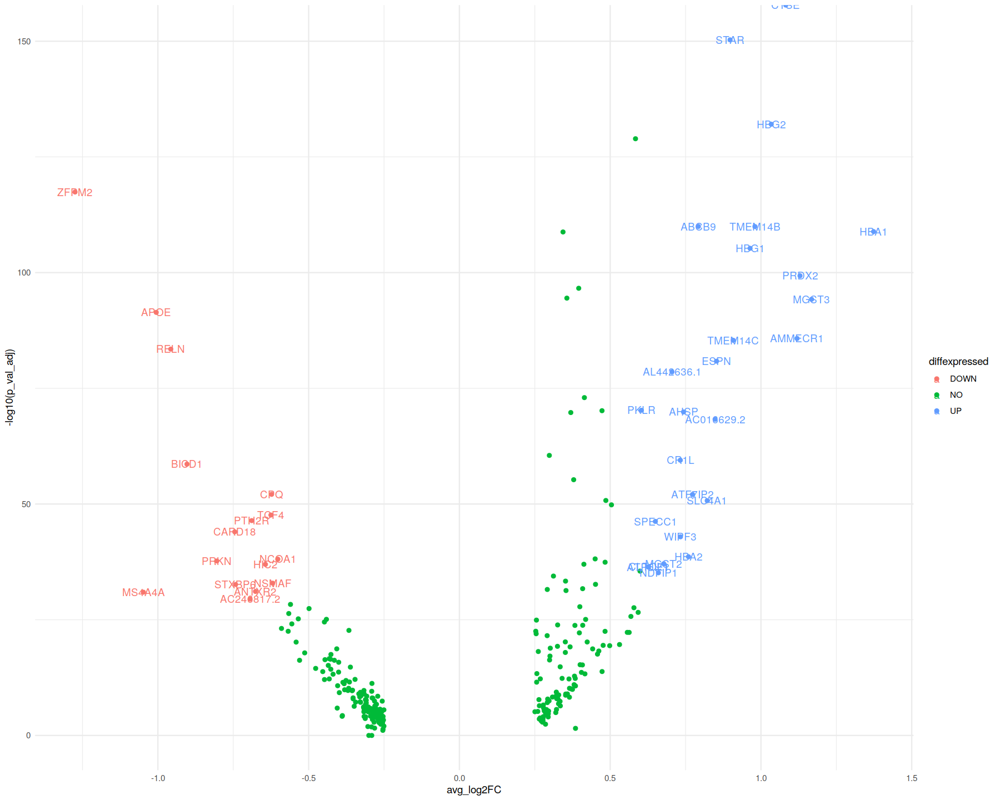

In [37]:
p <- ggplot(data=de, aes(x=avg_log2FC, y=-log10(p_val_adj))) + geom_point()
# Add vertical lines for log2FoldChange thresholds, and one horizontal line for the p-value threshold 
# The significantly differentially expressed genes are the ones found in the upper-left and upper-right corners.
# Add a column to the data frame to specify if they are UP- or DOWN- regulated (log2FoldChange respectively positive or negative)

# add a column of NAs
de$diffexpressed <- "NO"
# if log2Foldchange > 0.6 and pvalue < 0.05, set as "UP" 
de$diffexpressed[de$avg_log2FC > 0.6 & de$p_val_adj < 0.05] <- "UP"
# if log2Foldchange < -0.6 and pvalue < 0.05, set as "DOWN"
de$diffexpressed[de$avg_log2FC < -0.6 & de$p_val_adj < 0.05] <- "DOWN"

# Re-plot but this time color the points with "diffexpressed"
p <- ggplot(data=de, aes(x=avg_log2FC, y=-log10(p_val_adj), col=diffexpressed)) + geom_point() + theme_minimal()

# Add lines as before...
p2 <- p + geom_vline(xintercept=c(-0.6, 0.6), col="red") +
        geom_hline(yintercept=-log10(0.05), col="red")


## Change point color 

# 1. by default, it is assigned to the categories in an alphabetical order):
p3 <- p2 + scale_color_manual(values=c("blue", "black", "red"))

# 2. to automate a bit: ceate a named vector: the values are the colors to be used, the names are the categories they will be assigned to:
mycolors <- c("blue", "red", "black")
names(mycolors) <- c("DOWN", "UP", "NO")
p3 <- p2 + scale_colour_manual(values = mycolors)

# Now write down the name of genes beside the points...
# Create a new column "delabel" to de, that will contain the name of genes differentially expressed (NA in case they are not)
de$delabel <- NA
de$delabel[de$diffexpressed != "NO"] <- de$X[de$diffexpressed != "NO"]



Warning message:
“Removed 251 rows containing missing values (`geom_text_repel()`).”


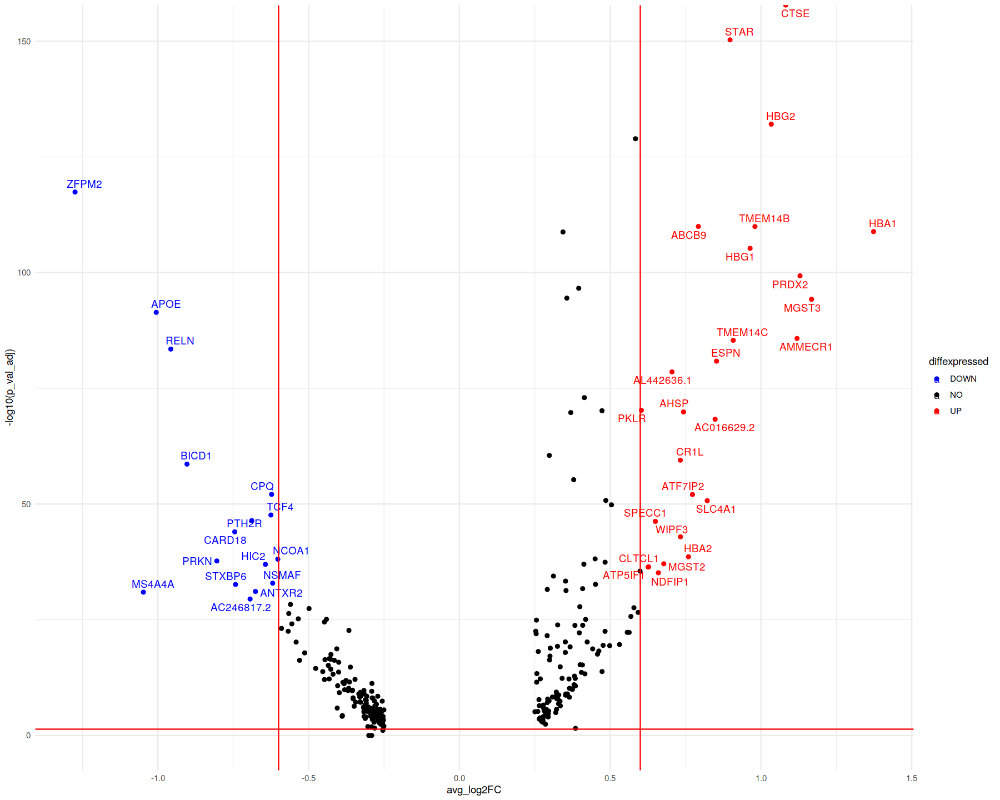

In [39]:
library(ggrepel)
# plot adding up all layers we have seen so far
ggplot(data=de, aes(x=avg_log2FC, y=-log10(p_val_adj), col=diffexpressed, label=delabel)) +
        geom_point() + 
        theme_minimal() +
        geom_text_repel() +
        scale_color_manual(values=c("blue", "black", "red")) +
        geom_vline(xintercept=c(-0.6, 0.6), col="red") +
        geom_hline(yintercept=-log10(0.05), col="red")